# Make plots for gene lists (Chemokines and MHCII related genes in MUC6 cells across regions/diseases)

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import drug2cell as d2c
import scipy

In [2]:
sc.logging.print_header()

/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/umap/distances.py:108

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.3.0 statsmodels==0.14.0 pynndescent==0.5.10


/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [3]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_compartments/all_muc6_cells_rawcounts_20230613.h5ad')

In [4]:
adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_compartments/all_muc6_cells_rawcounts_20230613.csv',index_col=0)

/tmp/ipykernel_3386/1900605583.py:1: DtypeWarning: Columns (62,63,64,65,66,67,70,84,100,101,102,105,112,113,114,115,117,119,123,124,125,126,127,128,129,130,131,132,133) have mixed types. Specify dtype option on import or set low_memory=False.
  adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_compartments/all_muc6_cells_rawcounts_20230613.csv',index_col=0)


In [5]:
adata

AnnData object with n_obs × n_vars = 19058 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [6]:
adata.X.max()

18131.0

In [7]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

In [8]:
adata.raw = adata

In [9]:
sc.pp.log1p(adata)

In [10]:
adata.X.max()

8.404984

In [11]:
targets = {"MHCII": ['IFI30','LGMN','CSTB','HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1',
                   'HLA-DQB1-AS1','HLA-DQA2','HLA-DQB2','HLA-DOB','HLA-DMB','HLA-DMA','HLA-DOA','HLA-DPA1','HLA-DPB1','CD74',
                  'CLIP1','CLIP2','CSTL','CSTS','RFX1','CIITA'],
          "Chemokines":['CCL20','CXCL6','CXCL1', 'CXCL5', 'CXCL3', 'CXCL2', 'CXCL9', 'CXCL10', 'CXCL11', 'CXCL13', 'CCL28', 'CXCL14','CCL26', 'CCL24',
 'CCL27', 'CCL19', 'CCL21', 'CXCL12', 'CCL22', 'CCL17', 'CXCL16', 'CCL2', 'CCL7', 'CCL11', 'CCL8', 'CCL13', 'CCL1', 'CCL5', 'CCL16', 'CCL14', 'CCL15',
                        'CCL23', 'CCL18', 'CCL3', 'CCL4', 'CCL3L1', 'CCL4L2', 'CCL25', 'CXCL17'],
          "IFNGR_MHCII_signaling_pathway":['IFNGR1','IFNGR2','JAK1','JAK2','STAT1','IRF1','CIITA']}

In [12]:
d2c.score(adata,targets=targets,use_raw=False)

In [13]:
import anndata
import pandas as pd
import scanpy as sc
import numpy as np

from scanpy.pl._dotplot import DotPlot

def dotplot_2obs(adata, gene, x_axis, y_axis, x_order=None, y_order=None):
    """
    A function that extracts the expression for a provided gene, 
    and subsequently prepares a dotplot where the two axes are 
    two categoricals from the obs of the object.
    
    Assumes expression data as a sparse matrix in adata.raw
    """
    #prepare dfs with dot sizes and colours
    #start off by making a helper df with all the info
    obs_tidy_master = adata.obs[[y_axis,x_axis]].set_index(y_axis)
    #add gene expression. TODO: not just sparse raw?
    obs_tidy_master[gene] = adata.raw[:,gene].X.todense()
    #this is where our computed values will go
    dot_size_df = pd.DataFrame(0, index=np.unique(obs_tidy_master.index), columns = np.unique(obs_tidy_master[x_axis]))
    #reorder the groups if specified
    if x_order is not None:
        dot_size_df = dot_size_df[x_order]
    if y_order is not None:
        dot_size_df = dot_size_df.loc[y_order,:]
    dot_color_df = dot_size_df.copy()
    #compute the sizes and colors, replicating the logic found within DotPlot()
    for cat in dot_size_df.columns:
        obs_tidy = obs_tidy_master.loc[obs_tidy_master[x_axis]==cat, gene]
        obs_bool = obs_tidy > 0
        dot_color_df[cat] = obs_tidy.groupby(level=0).mean().fillna(0)
        dot_size_df[cat] = obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
    #some combinations may be absent, and there will be NaNs there, and this will kill the plot
    #fill with zeroes
    dot_color_df.fillna(0, inplace=True)
    dot_size_df.fillna(0, inplace=True)
    #in order to actually plot this, we need to make a dummy anndata object
    #just how DotPlot() is wired internally
    bdata = anndata.AnnData(np.zeros(dot_size_df.shape))
    bdata.var_names = dot_size_df.columns
    #this needs to be turned to a list or it whines about a conflict later
    bdata.obs_names = list(dot_size_df.index)
    #the grouping variable needs to be present in the dummy object
    #its existence is checked, it actually does nothing when we insert the dot sizes
    bdata.obs[y_axis] = dot_size_df.index
    #actually make the dotplot, with the best colour scheme :P
    dp = DotPlot(bdata, dot_size_df.columns, y_axis, dot_size_df=dot_size_df, dot_color_df=dot_color_df, title=gene)
    dp = dp.style(cmap='OrRd')
    dp.make_figure()

/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


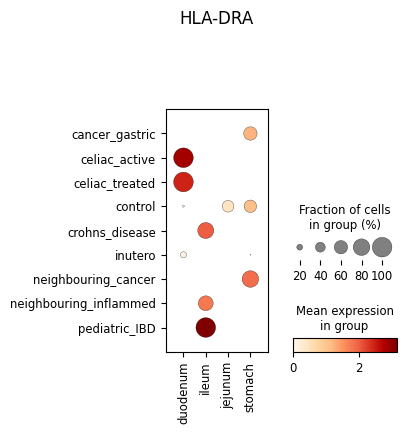

In [14]:
dotplot_2obs(adata,gene = "HLA-DRA",x_axis="organ_unified", y_axis="disease")

### dotplot2obs for a gene score

In [15]:
import scipy.sparse
import anndata
import pandas as pd
import scanpy as sc
import numpy as np

from scanpy.pl._dotplot import DotPlot

def dotplot_2obs(adata, gene, x_axis, y_axis, x_order=None, y_order=None, use_raw=True, fill_na=True):
    """
    A function that extracts the expression for a provided gene, 
    and subsequently prepares a dotplot where the two axes are 
    two categoricals from the obs of the object.
    
    Can be controlled between .raw and .X via use_raw (defaults to raw)
    By default fills nonexistent obs combinations as zeroes in the plot
    (as otherwise the plot can error in weird ways sometimes)
    """
    #prepare dfs with dot sizes and colours
    #start off by making a helper df with all the info
    obs_tidy_master = adata.obs[[y_axis,x_axis]].set_index(y_axis)
    #add gene expression
    if use_raw:
        if scipy.sparse.issparse(adata.raw.X):
            obs_tidy_master[gene] = adata.raw[:,gene].X.todense()
        else:
            obs_tidy_master[gene] = adata.raw[:,gene].X.flatten()
    else:
        if scipy.sparse.issparse(adata.X):
            obs_tidy_master[gene] = adata[:,gene].X.todense()
        else:
            obs_tidy_master[gene] = adata[:,gene].X.flatten()
    #this is where our computed values will go
    dot_size_df = pd.DataFrame(0, index=np.unique(obs_tidy_master.index), columns = np.unique(obs_tidy_master[x_axis]))
    #reorder the groups if specified
    if x_order is not None:
        dot_size_df = dot_size_df[x_order]
    if y_order is not None:
        dot_size_df = dot_size_df.loc[y_order,:]
    dot_color_df = dot_size_df.copy()
    #compute the sizes and colors, replicating the logic found within DotPlot()
    for cat in dot_size_df.columns:
        obs_tidy = obs_tidy_master.loc[obs_tidy_master[x_axis]==cat, gene]
        obs_bool = obs_tidy > 0
        dot_color_df[cat] = obs_tidy.groupby(level=0).mean().fillna(0)
        dot_size_df[cat] = obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
    #some combinations may be absent, and there will be NaNs there, and this sometimes kills the plot
    #fill with zeroes if specified
    if fill_na:
        dot_color_df.fillna(0, inplace=True)
        dot_size_df.fillna(0, inplace=True)
    #in order to actually plot this, we need to make a dummy anndata object
    #just how DotPlot() is wired internally
    bdata = anndata.AnnData(np.zeros(dot_size_df.shape))
    bdata.var_names = dot_size_df.columns
    #this needs to be turned to a list or it whines about a conflict later
    bdata.obs_names = list(dot_size_df.index)
    #the grouping variable needs to be present in the dummy object
    #its existence is checked, it actually does nothing when we insert the dot sizes
    bdata.obs[y_axis] = dot_size_df.index
    #actually make the dotplot, with the best colour scheme :P
    dp = DotPlot(bdata, dot_size_df.columns, y_axis, dot_size_df=dot_size_df, dot_color_df=dot_color_df, title=gene)
    dp = dp.style(cmap='OrRd')
    dp.make_figure()

/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:697: RuntimeWarning: invalid value encountered in divide
  frac = (frac - dot_min) / old_range
/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


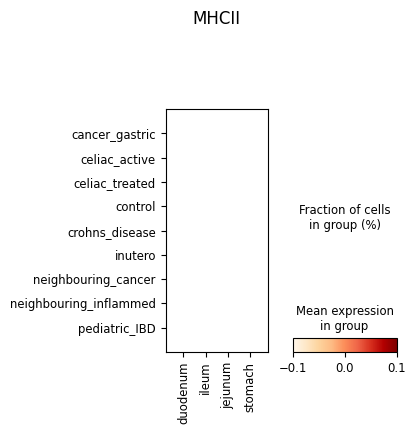

In [16]:
dotplot_2obs(adata.uns['drug2cell'],gene = "MHCII",x_axis="organ_unified", y_axis="disease", use_raw=False)

In [17]:
adata.uns['drug2cell']

AnnData object with n_obs × n_vars = 19058 × 3
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced

In [18]:
adata.uns['drug2cell'][:,'MHCII'].X

ArrayView([[0.66434796],
           [0.        ],
           [0.31585956],
           ...,
           [0.1286279 ],
           [0.12921809],
           [0.72189716]])

In [19]:
adata_test = adata.uns['drug2cell']
gene = "MHCII"
x_axis="organ_unified"
y_axis="disease"

obs_tidy_master = adata_test.obs[[y_axis,x_axis]].set_index(y_axis)

In [20]:
obs_tidy_master

,organ_unified
disease,
control,stomach
control,stomach
control,stomach
control,stomach
control,stomach
...,...
celiac_active,duodenum
celiac_treated,duodenum
control,duodenum


In [21]:
use_raw = False

if use_raw:
    if scipy.sparse.issparse(adata_test.raw.X):
        obs_tidy_master[gene] = adata_test.raw[:,gene].X.todense()
    else:
        obs_tidy_master[gene] = adata_test.raw[:,gene].X.flatten()
else:
    if scipy.sparse.issparse(adata_test.X):
        obs_tidy_master[gene] = adata_test[:,gene].X.todense()
    else:
        obs_tidy_master[gene] = adata_test[:,gene].X.flatten()

In [22]:
obs_tidy_master

,organ_unified,MHCII
disease,,
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
...,...,...
celiac_active,duodenum,NaN
celiac_treated,duodenum,NaN
control,duodenum,NaN


In [23]:
adata_test[:,gene].X.flatten()

ArrayView([0.66434796, 0.        , 0.31585956, ..., 0.1286279 ,
           0.12921809, 0.72189716])

In [24]:
obs_tidy_master.shape

(19058, 2)

In [25]:
adata_test[:,gene].X.flatten().shape

(19058,)

In [26]:
adata

AnnData object with n_obs × n_vars = 19058 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [27]:
adata.uns['drug2cell']

AnnData object with n_obs × n_vars = 19058 × 3
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced

In [28]:
adata.uns['drug2cell'][:,'MHCII'].X

ArrayView([[0.66434796],
           [0.        ],
           [0.31585956],
           ...,
           [0.1286279 ],
           [0.12921809],
           [0.72189716]])

In [29]:
adata_test = adata.uns['drug2cell']
gene = "MHCII"
x_axis="organ_unified"
y_axis="disease"

obs_tidy_master = adata_test.obs[[y_axis,x_axis]].set_index(y_axis)

In [30]:
obs_tidy_master

,organ_unified
disease,
control,stomach
control,stomach
control,stomach
control,stomach
control,stomach
...,...
celiac_active,duodenum
celiac_treated,duodenum
control,duodenum


In [31]:
use_raw = False

if use_raw:
    if scipy.sparse.issparse(adata_test.raw.X):
        obs_tidy_master[gene] = adata_test.raw[:,gene].X.todense()
    else:
        obs_tidy_master[gene] = adata_test.raw[:,gene].X.flatten()
else:
    if scipy.sparse.issparse(adata_test.X):
        obs_tidy_master[gene] = adata_test[:,gene].X.todense()
    else:
        obs_tidy_master[gene] = adata_test[:,gene].X.flatten()

In [32]:
obs_tidy_master

,organ_unified,MHCII
disease,,
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
control,stomach,NaN
...,...,...
celiac_active,duodenum,NaN
celiac_treated,duodenum,NaN
control,duodenum,NaN


In [33]:
adata_test[:,gene].X.flatten()

ArrayView([0.66434796, 0.        , 0.31585956, ..., 0.1286279 ,
           0.12921809, 0.72189716])

In [34]:
obs_tidy_master.shape

(19058, 2)

In [35]:
adata_test[:,gene].X.flatten().shape

(19058,)

In [36]:
adata = adata.uns['drug2cell']

In [37]:
holder = pd.DataFrame(adata[:,gene].X, index=adata.obs_names, columns=[gene])

In [38]:
holder

,MHCII
index,
AAACCTGCATGTAAGA-HCA_A_GT12935004,0.664348
AAACGGGCATCGATTG-HCA_A_GT12935004,0.000000
AAACGGGTCTGGTGTA-HCA_A_GT12935004,0.315860
AAAGCAAAGCTGTCTA-HCA_A_GT12935004,0.383481
AAAGCAAGTCAGTGGA-HCA_A_GT12935004,0.498979
...,...
TTGCCGTTCGAGAACG-1_6-GI4288_DUO_EPI_GEX,1.149156
AATCCAGAGTTGAGAT-1_12-GI4359_DUO_EPI_GEX,0.863111
CTGCGGATCAGTACGT-1_14-GI4394_DUO_EPI_GEX,0.128628


In [39]:
import scipy.sparse
import anndata
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

from scanpy.pl._dotplot import DotPlot

def dotplot_2obs(adata, gene, x_axis, y_axis, x_order=None, y_order=None, use_raw=True, fill_na=True, output_file=None):
    """
    A function that extracts the expression for a provided gene, 
    and subsequently prepares a dotplot where the two axes are 
    two categoricals from the obs of the object.
    
    Can be controlled between .raw and .X via use_raw (defaults to raw)
    By default fills nonexistent obs combinations as zeroes in the plot
    (as otherwise the plot can error in weird ways sometimes)
    """
    #prepare dfs with dot sizes and colours
    #start off by making a helper df with all the info
    obs_tidy_master = adata.obs[[y_axis,x_axis]].set_index(y_axis)
    #add gene expression
    if use_raw:
        if scipy.sparse.issparse(adata.raw.X):
            obs_tidy_master[gene] = adata.raw[:,gene].X.todense()
        else:
            obs_tidy_master[gene] = np.array(adata.raw[:,gene].X)
    else:
        if scipy.sparse.issparse(adata.X):
            obs_tidy_master[gene] = adata[:,gene].X.todense()
        else:
            obs_tidy_master[gene] = np.array(adata[:,gene].X)
    #this is where our computed values will go
    dot_size_df = pd.DataFrame(0, index=np.unique(obs_tidy_master.index), columns = np.unique(obs_tidy_master[x_axis]))
    #reorder the groups if specified
    if x_order is not None:
        dot_size_df = dot_size_df[x_order]
    if y_order is not None:
        dot_size_df = dot_size_df.loc[y_order,:]
    dot_color_df = dot_size_df.copy()
    #compute the sizes and colors, replicating the logic found within DotPlot()
    for cat in dot_size_df.columns:
        obs_tidy = obs_tidy_master.loc[obs_tidy_master[x_axis]==cat, gene]
        obs_bool = obs_tidy > 0
        dot_color_df[cat] = obs_tidy.groupby(level=0).mean().fillna(0)
        dot_size_df[cat] = obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
    #some combinations may be absent, and there will be NaNs there, and this sometimes kills the plot
    #fill with zeroes if specified
    if fill_na:
        dot_color_df.fillna(0, inplace=True)
        dot_size_df.fillna(0, inplace=True)
    #in order to actually plot this, we need to make a dummy anndata object
    #just how DotPlot() is wired internally
    bdata = anndata.AnnData(np.zeros(dot_size_df.shape))
    bdata.var_names = dot_size_df.columns
    #this needs to be turned to a list or it whines about a conflict later
    bdata.obs_names = list(dot_size_df.index)
    #the grouping variable needs to be present in the dummy object
    #its existence is checked, it actually does nothing when we insert the dot sizes
    bdata.obs[y_axis] = dot_size_df.index
    #actually make the dotplot, with the best colour scheme :P
    dp = DotPlot(bdata, dot_size_df.columns, y_axis, dot_size_df=dot_size_df, dot_color_df=dot_color_df, title=gene)
    dp = dp.style(cmap='OrRd')
    dp.make_figure()
    fig = plt.gcf()  # Get the current figure
    
    if output_file is not None:
        fig.savefig(output_file)
    
    return fig


/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


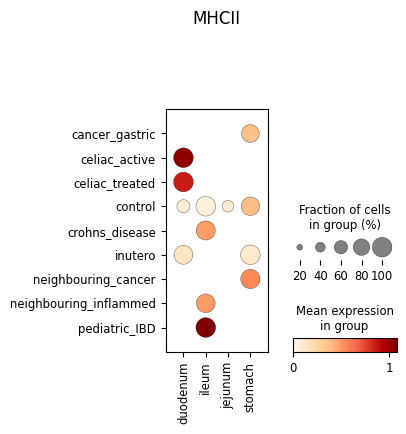

In [40]:
fig = dotplot_2obs(adata,gene = "MHCII",x_axis="organ_unified", y_axis="disease", use_raw=False,output_file='dotplot2obs_MHCII_muc6.pdf')
fig.show()

In [41]:
adata.obs['organ_disease'] = adata.obs['organ_unified'].astype(str) + '_' + adata.obs['disease'].astype(str)

In [42]:
adata.obs.organ_disease.value_counts()

stomach_neighbouring_cancer     11669
stomach_cancer_gastric           6136
stomach_control                   567
stomach_inutero                   369
ileum_crohns_disease              159
duodenum_control                   71
ileum_neighbouring_inflammed       32
duodenum_celiac_active             24
duodenum_inutero                   19
ileum_pediatric_IBD                 8
jejunum_control                     2
ileum_control                       1
duodenum_celiac_treated             1
Name: organ_disease, dtype: int64

In [43]:
#remove categories with 2 or less cells

In [44]:
adata = adata[~adata.obs.organ_disease.isin(['jejunum_control','ileum_control','duodenum_celiac_treated'])].copy()

In [45]:
adata

AnnData object with n_obs × n_vars = 19054 × 3
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced

In [46]:
arr = np.array(['control',
 'inutero',
 'celiac_active',
 'crohns_disease',
                'pediatric_IBD',
 
 'neighbouring_inflammed',
                'cancer_gastric',
                'neighbouring_cancer',
                
 ])

In [47]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


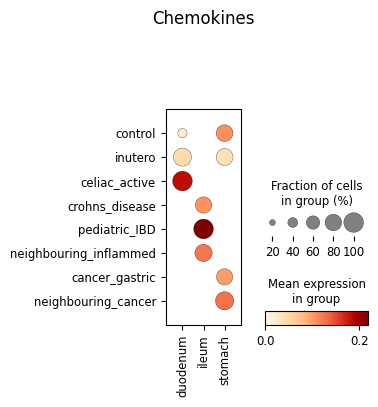

In [48]:
fig = dotplot_2obs(adata,gene = "Chemokines",x_axis="organ_unified", y_axis="disease",y_order=arr, use_raw=False,output_file='dotplot2obs_chemokines_muc6.pdf')
fig.show()

/home/jovyan/my-conda-envs/d2c/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


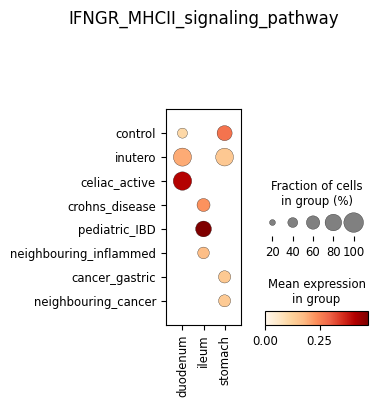

In [49]:
#Figure 5f
fig = dotplot_2obs(adata,gene = "IFNGR_MHCII_signaling_pathway",x_axis="organ_unified", y_axis="disease",y_order=arr, use_raw=False,output_file='dotplot2obs_ifngr_muc6.pdf')
fig.show()

### Plot gene scores for paper figures

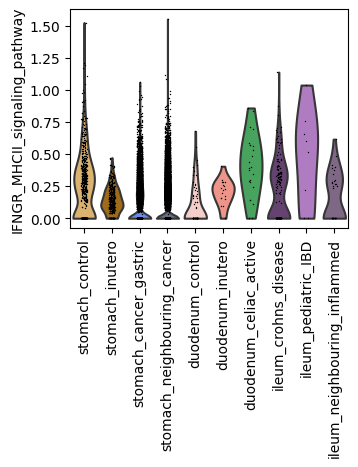

In [50]:
plt.rcParams['figure.figsize'] = [4,3]
sc.pl.violin(adata,keys='IFNGR_MHCII_signaling_pathway',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    },
             order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_IFNGR_MHCII_MUC6_disease_organ.pdf')

In [51]:
sc.set_figure_params(
    dpi=300,dpi_save=600,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [52]:
import seaborn as sns
sns.set_style(style="white")
sns.set_context(context="paper")

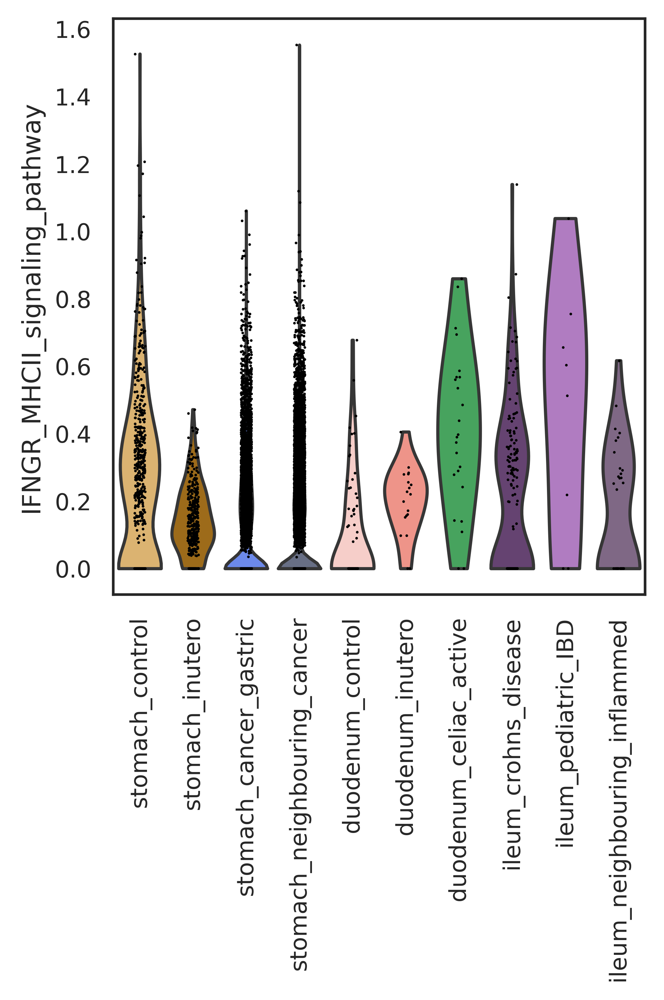

In [53]:
sc.pl.violin(adata,keys='IFNGR_MHCII_signaling_pathway',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    },
            order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_IFNGR_MHCII_MUC6_disease_organ.png')

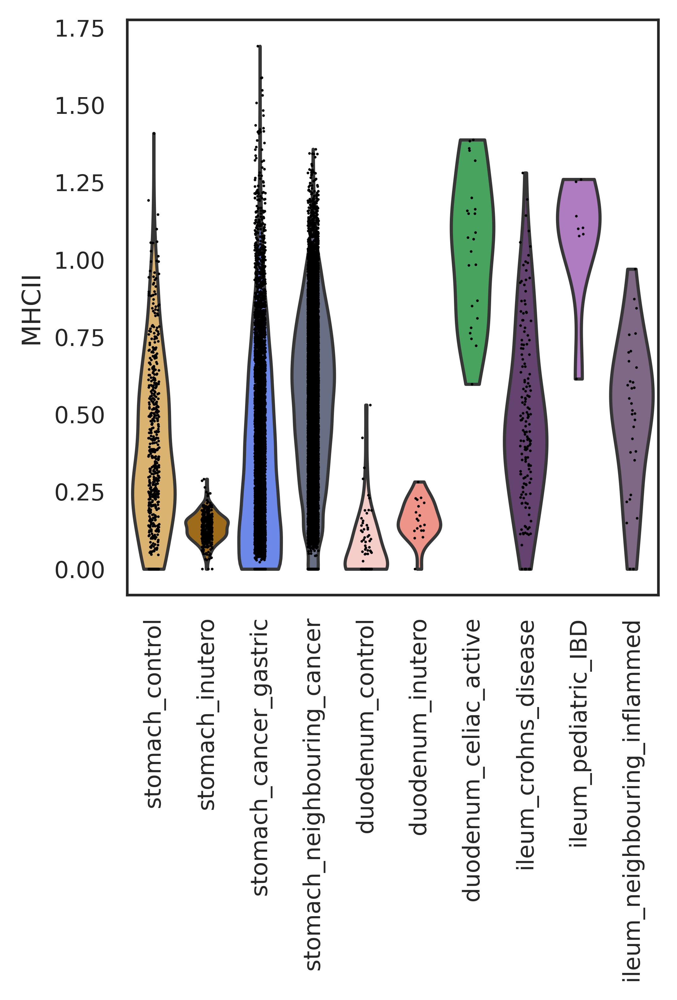

In [54]:
#Figure 5d
sc.pl.violin(adata,keys='MHCII',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    }, order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_MHCII_MUC6_disease_organ.pdf')

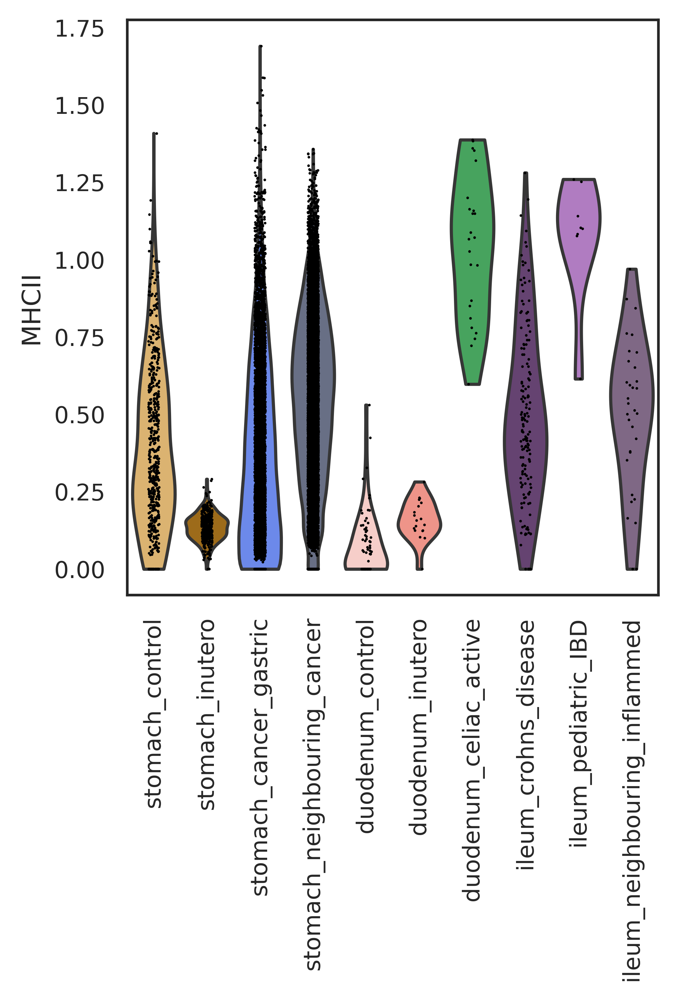

In [55]:
sc.pl.violin(adata,keys='MHCII',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    },  order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_MHCII_MUC6_disease_organ.png')

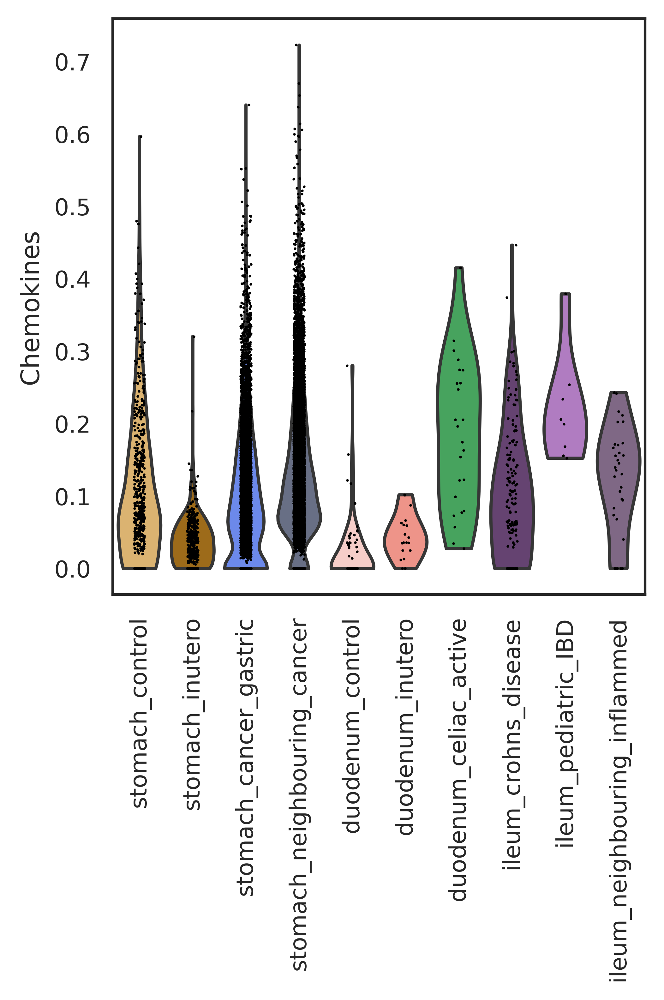

In [56]:
#Figure 5a
sc.pl.violin(adata,keys='Chemokines',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    },  order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_chemokines_MUC6_disease_organ.pdf')

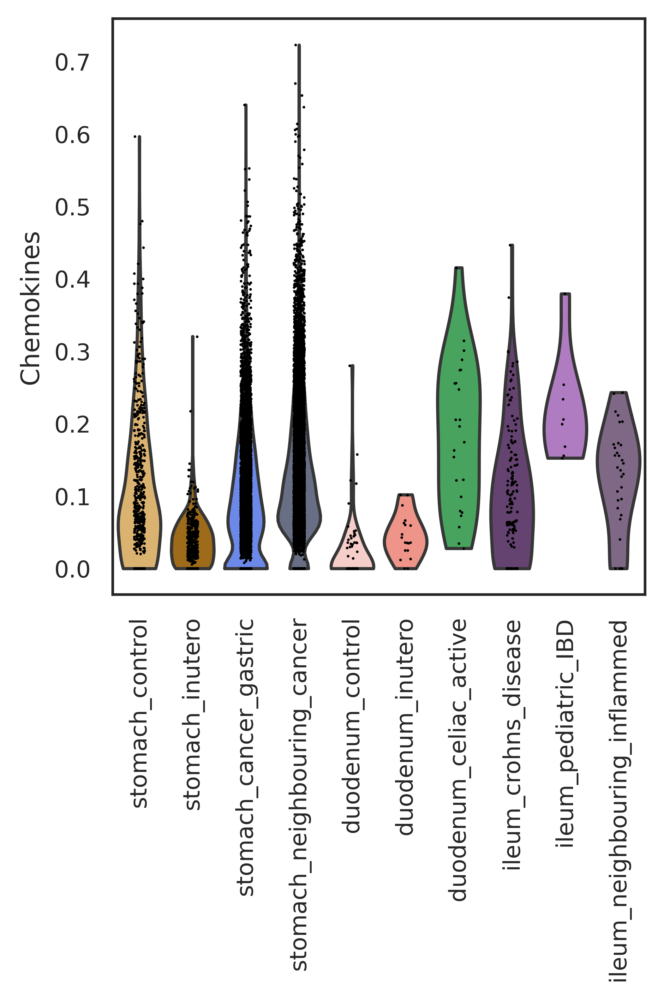

In [57]:
sc.pl.violin(adata,keys='Chemokines',groupby='organ_disease',rotation=90,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    }, order=['stomach_control','stomach_inutero','stomach_cancer_gastric',
                   'stomach_neighbouring_cancer','duodenum_control','duodenum_inutero','duodenum_celiac_active','ileum_crohns_disease','ileum_pediatric_IBD',
                    'ileum_neighbouring_inflammed'],save='d2cscoring_chemokines_MUC6_disease_organ.png')

In [58]:
list(adata.obs['disease'].unique())

['control',
 'inutero',
 'neighbouring_cancer',
 'pediatric_IBD',
 'crohns_disease',
 'cancer_gastric',
 'neighbouring_inflammed',
 'celiac_active']

In [59]:
full_adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_healthy_disease.plus_additional_epi.18485genes.with_fineannot.nodoublets.20230322.h5ad')

In [60]:
full_adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy_disease.plus_additional_epi.18485genes.with_fineannot.nodoublets.20230322.csv',index_col=0)

/tmp/ipykernel_3386/1154344099.py:1: DtypeWarning: Columns (3,5,6,8,9,11,12,14,62,63,64,65,66,67,70,73,75,82,83,84,86,92,93,95,100,101,102,105,106,108,109,111,112,113,114,115,117,119,123,124,125,126,127,128,129,130,131,132,133) have mixed types. Specify dtype option on import or set low_memory=False.
  full_adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy_disease.plus_additional_epi.18485genes.with_fineannot.nodoublets.20230322.csv',index_col=0)


make violin plot of all small intestine cells with these scores

In [61]:
si_epi = full_adata[full_adata.obs.level_1_annot.isin(['Epithelial'])].copy()

In [62]:
si_epi

AnnData object with n_obs × n_vars = 659483 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [63]:
si_epi = si_epi[si_epi.obs.organ_groups.isin(['Small_intestine'])].copy()

In [64]:
si_epi

AnnData object with n_obs × n_vars = 274760 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [65]:
list(si_epi.obs['disease'].unique())

['control',
 'inutero',
 'neighbouring_polyps',
 'neighbouring_inflammed',
 'preterm',
 'neighbouring_cancer',
 'pediatric_IBD',
 'crohns_disease',
 'celiac_active',
 'celiac_treated']

In [66]:
si_epi = si_epi[~si_epi.obs.disease.isin(['inutero','preterm'])].copy()

In [67]:
si_epi

AnnData object with n_obs × n_vars = 221900 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [68]:
list(si_epi.obs['disease'].unique())

['control',
 'neighbouring_polyps',
 'neighbouring_inflammed',
 'neighbouring_cancer',
 'pediatric_IBD',
 'crohns_disease',
 'celiac_active',
 'celiac_treated']

In [69]:
si_epi.obs['reference_vs_query'] = (si_epi.obs["disease"].map(lambda x: {
'control':'reference',
 'neighbouring_polyps':'reference',
 'neighbouring_inflammed':'reference',
 'neighbouring_cancer':'reference',
 'pediatric_IBD':'query',
 'crohns_disease':'query',
 'celiac_active':'query',
 'celiac_treated':'reference'
        
         }.get(x, x)).astype("category"))

In [70]:
si_epi

AnnData object with n_obs × n_vars = 221900 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [71]:
sc.pp.normalize_per_cell(si_epi, counts_per_cell_after=1e4)
sc.pp.log1p(si_epi)

In [72]:
si_epi.obs['celltype_disease'] = si_epi.obs.level_3_annot.astype(str)+'_'+si_epi.obs.disease.astype(str)

In [73]:
d2c.score(si_epi,targets=targets,use_raw=False)

In [74]:
si_epi.uns['drug2cell']

AnnData object with n_obs × n_vars = 221900 × 3
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_splice

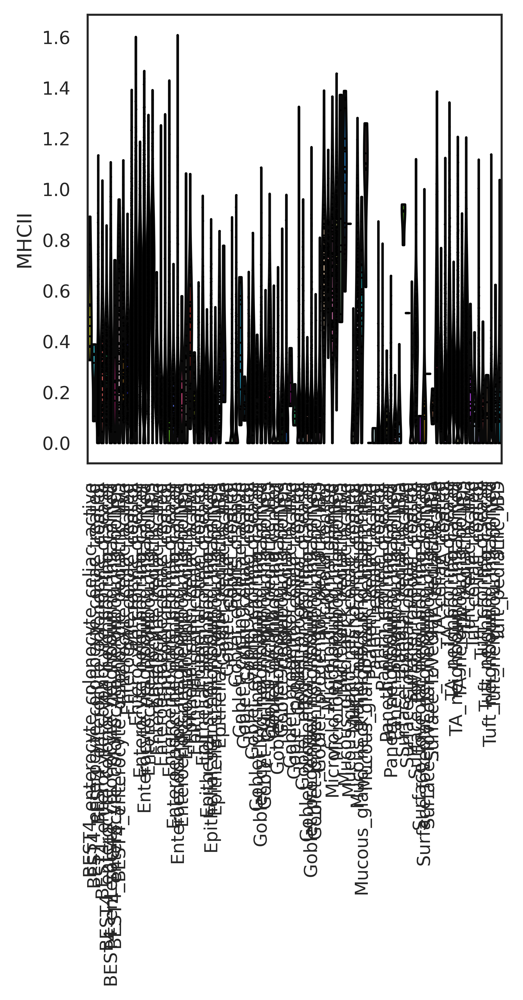

In [75]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='MHCII',groupby='celltype_disease',rotation=90)

In [76]:
si_epi.obs['celltype_refvsquery'] = si_epi.obs.level_3_annot.astype(str)+'_'+si_epi.obs.reference_vs_query.astype(str)

In [77]:
d2c.score(si_epi,targets=targets,use_raw=False)

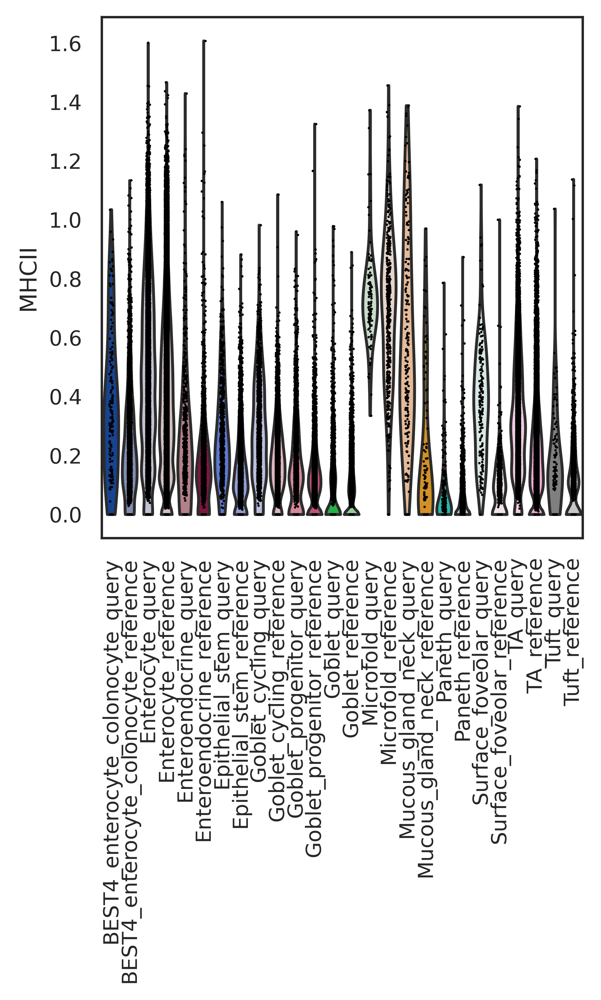

In [78]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='MHCII',groupby='celltype_refvsquery',rotation=90)

In [79]:
list(si_epi.uns['drug2cell'].obs.celltype_refvsquery.unique())

['TA_reference',
 'Microfold_reference',
 'Enterocyte_reference',
 'Epithelial_stem_reference',
 'Goblet_cycling_reference',
 'Goblet_progenitor_reference',
 'BEST4_enterocyte_colonocyte_reference',
 'Goblet_reference',
 'Tuft_reference',
 'Enteroendocrine_reference',
 'Surface_foveolar_reference',
 'Paneth_reference',
 'Mucous_gland_neck_reference',
 'Goblet_cycling_query',
 'TA_query',
 'Goblet_progenitor_query',
 'Enterocyte_query',
 'Epithelial_stem_query',
 'Enteroendocrine_query',
 'Microfold_query',
 'Goblet_query',
 'BEST4_enterocyte_colonocyte_query',
 'Tuft_query',
 'Paneth_query',
 'Mucous_gland_neck_query',
 'Surface_foveolar_query']

In [80]:
si_epi.uns['drug2cell'].obs['celltype_refvsquery'].cat.reorder_categories([
 'BEST4_enterocyte_colonocyte_reference',
    'BEST4_enterocyte_colonocyte_query',
    'Enterocyte_reference',
    'Enterocyte_query',
    'Enteroendocrine_reference',
    'Enteroendocrine_query',
    'Epithelial_stem_reference',
    'Epithelial_stem_query',
    'Goblet_cycling_reference',
    'Goblet_cycling_query',
    'Goblet_progenitor_reference',
    'Goblet_progenitor_query',
    'Goblet_reference',
    'Goblet_query',
    'Microfold_reference',
    'Microfold_query',
    'Mucous_gland_neck_reference',
    'Mucous_gland_neck_query',
    'Paneth_reference',
     'Paneth_query',
    'Surface_foveolar_reference',
     'Surface_foveolar_query',
    'TA_reference',
  'TA_query',
 'Tuft_reference', 
 'Tuft_query',

], inplace=True)

/tmp/ipykernel_3386/1367799174.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  si_epi.uns['drug2cell'].obs['celltype_refvsquery'].cat.reorder_categories([


In [81]:
plt.rcParams['figure.figsize'] = [5,3]

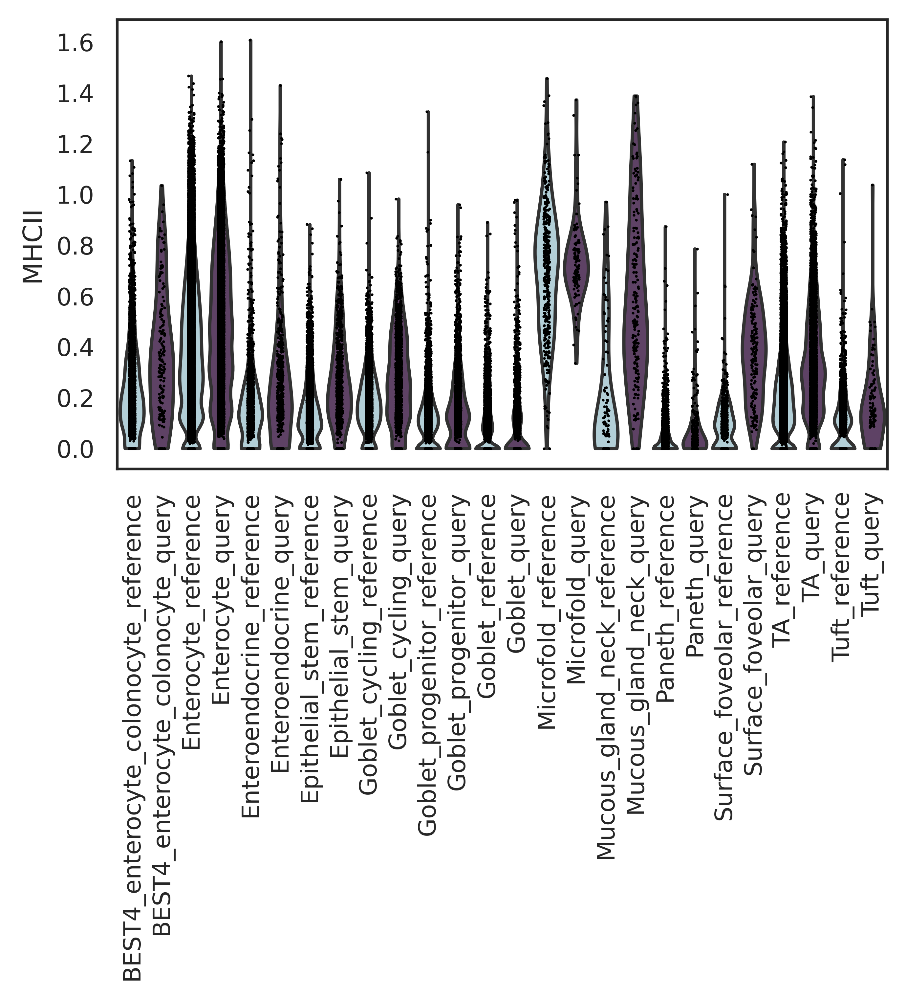

In [82]:
#MHCII healthy vs disease all small intestine epithelial celltypes - Extended data 9i
sc.pl.violin(si_epi.uns['drug2cell'],keys='MHCII',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_MHCII_allSIepi_refvsquery.pdf')

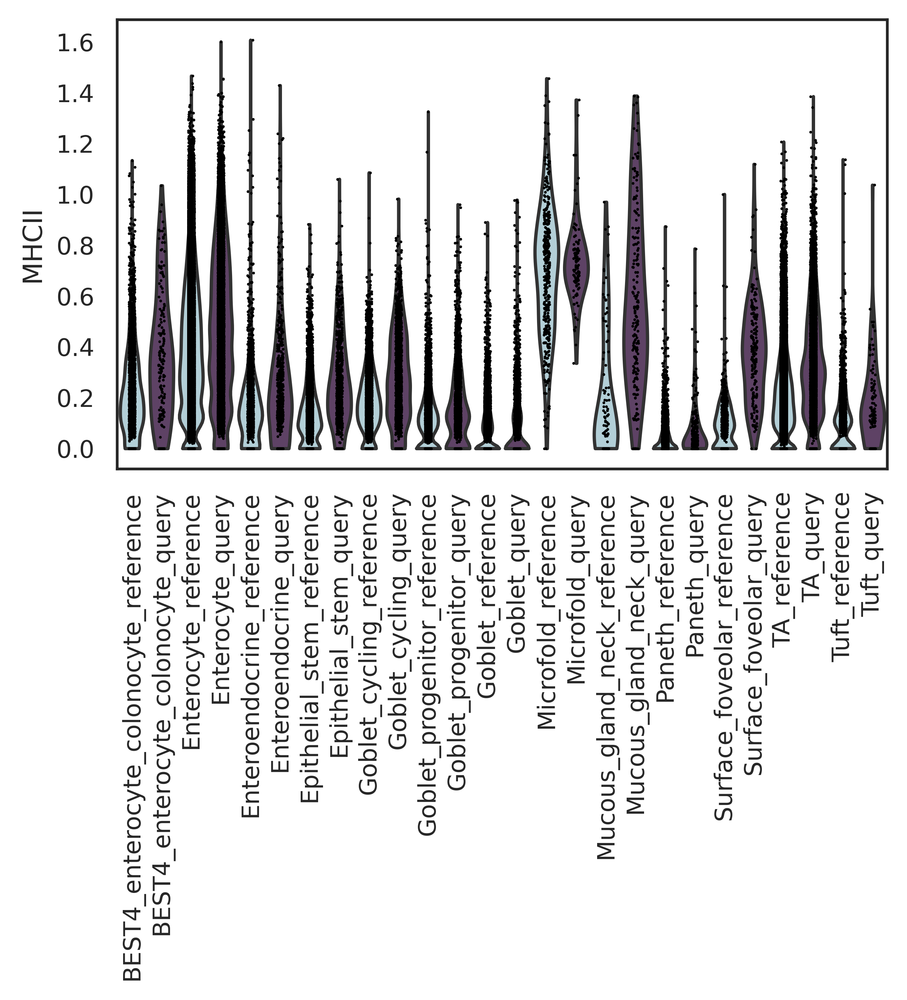

In [83]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='MHCII',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_MHCII_allSIepi_refvsquery.png')

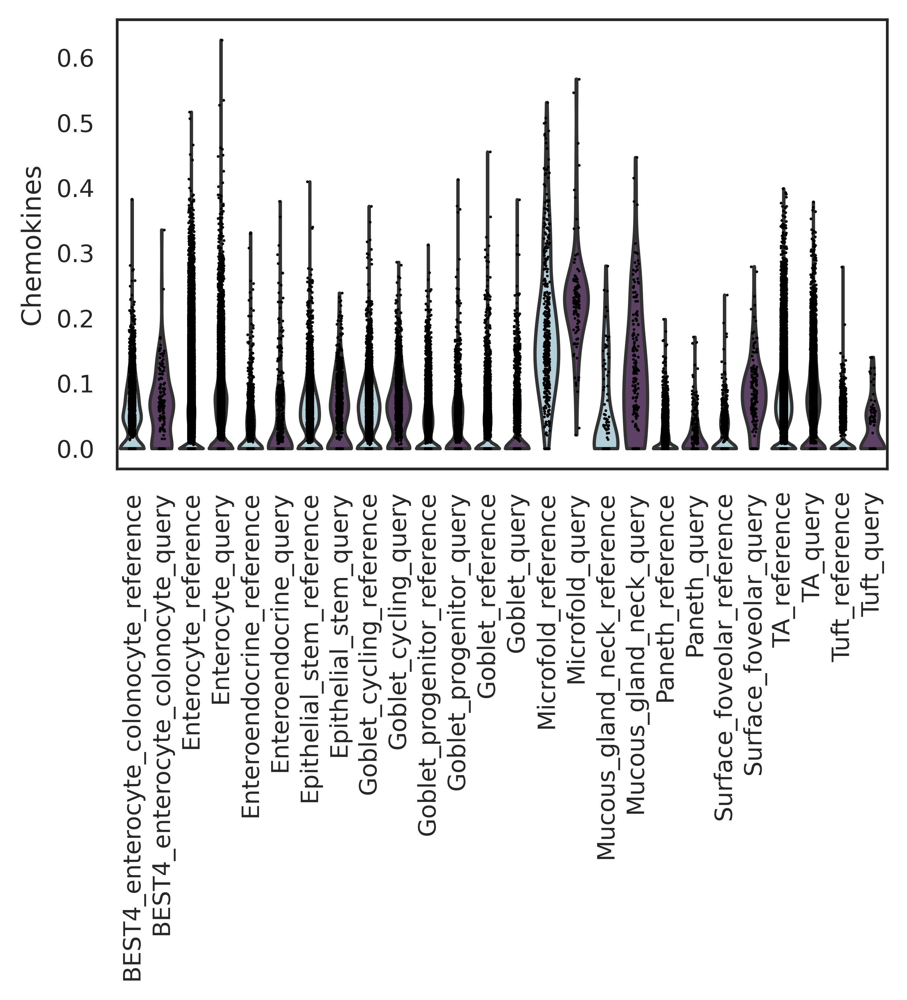

In [84]:
#Chemokines healthy vs disease all small intestine epithelial celltypes - Extended data 9i
sc.pl.violin(si_epi.uns['drug2cell'],keys='Chemokines',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_chemokines_allSIepi_refvsquery.pdf')

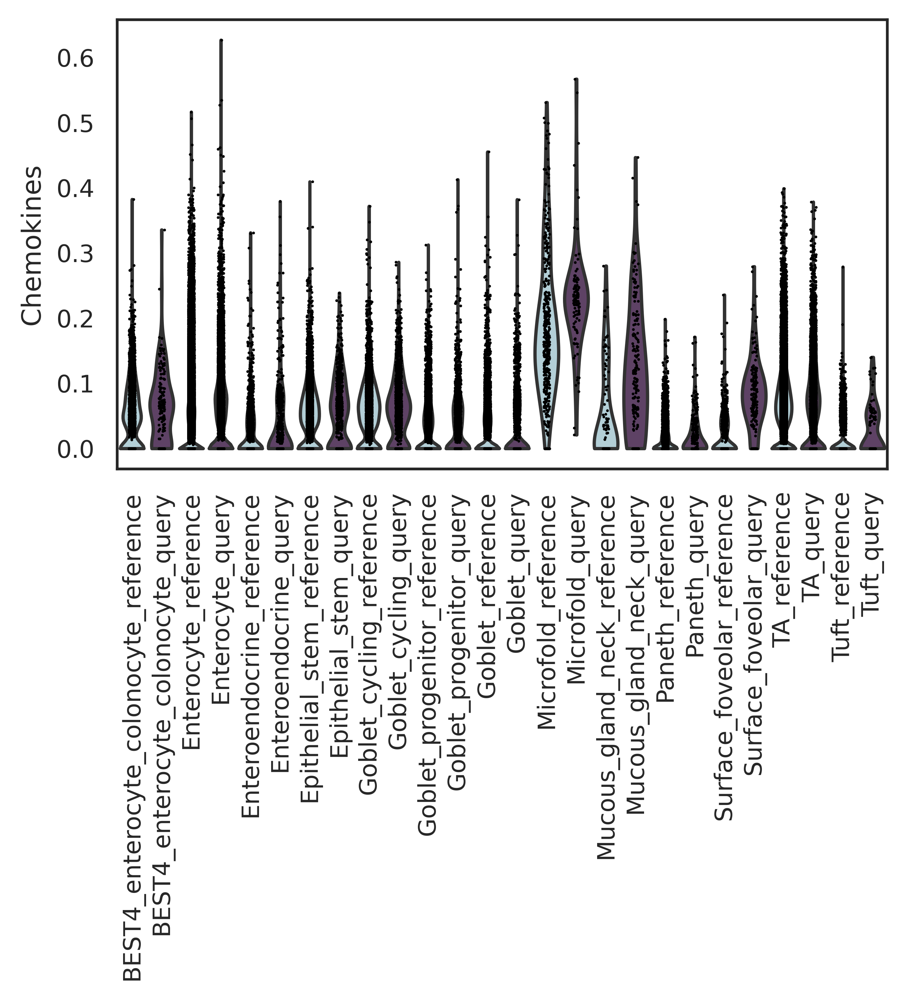

In [85]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='Chemokines',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_chemokines_allSIepi_refvsquery.png')

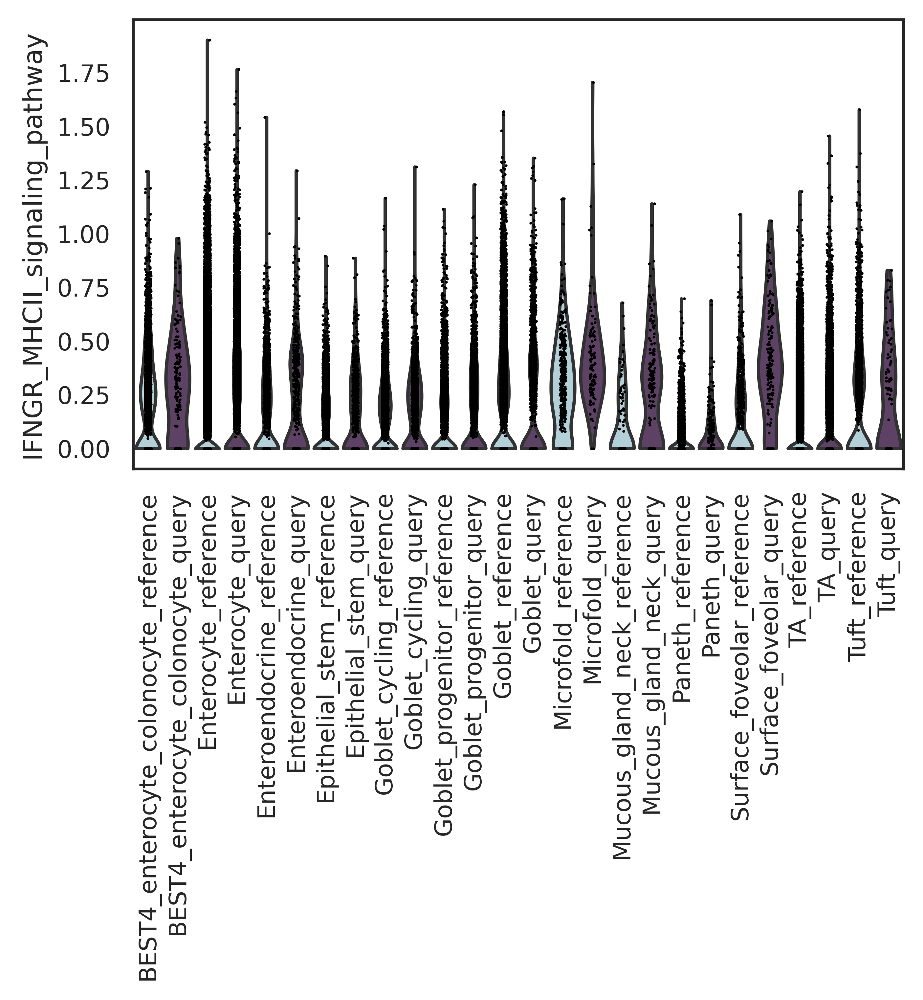

In [86]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='IFNGR_MHCII_signaling_pathway',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_IFNGR_allSIepi_refvsquery.png')

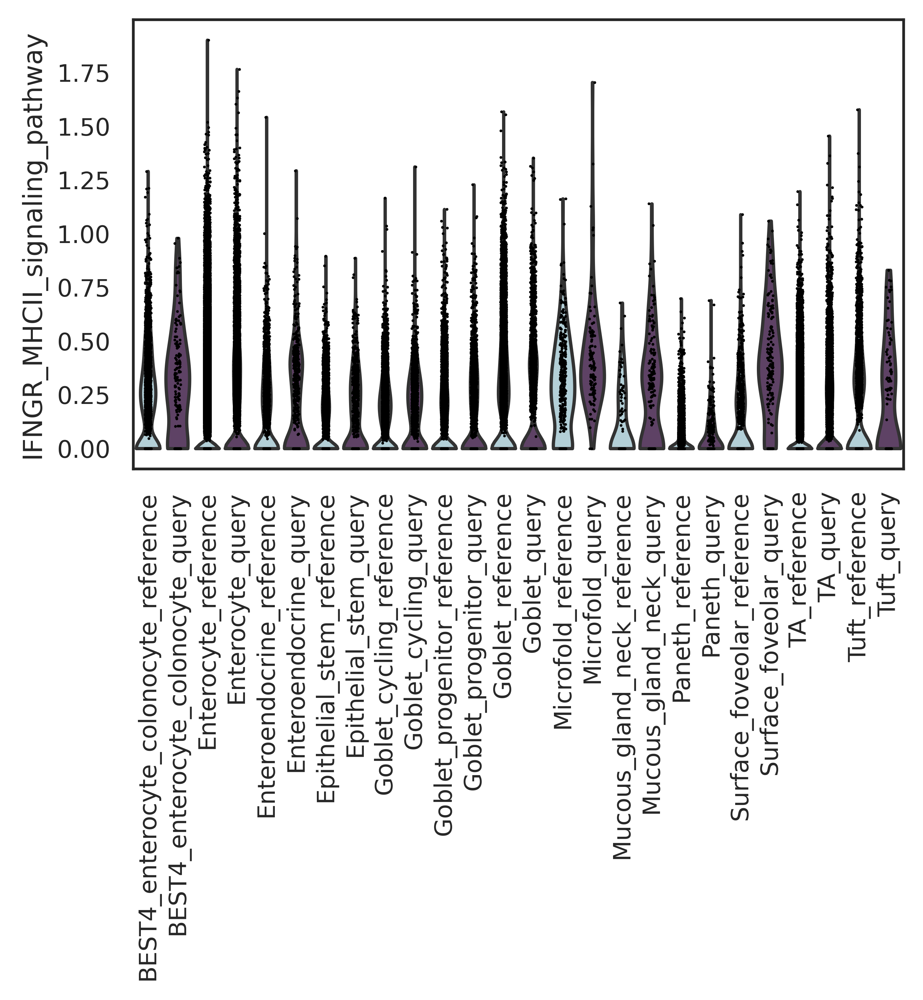

In [87]:
sc.pl.violin(si_epi.uns['drug2cell'],keys='IFNGR_MHCII_signaling_pathway',groupby='celltype_refvsquery',rotation=90,palette=['#ADD3DD','#613c6b'],save='d2cscore_IFNGR_allSIepi_refvsquery.pdf')